# InfoGAN
*Please note that this is an optional notebook meant to introduce more advanced concepts. If you’re up for a challenge, take a look and don’t worry if you can’t follow everything. There is no code to implement—only some cool code for you to learn and run!*

### Goals

In this notebook, you're going to learn about InfoGAN in order to generate disentangled outputs, based on the paper, [InfoGAN: Interpretable Representation Learning by Information Maximizing Generative Adversarial Nets](https://arxiv.org/abs/1606.03657) by Chen et. al. While there are many approaches to disentanglement, this is one of the more widely used and better known. 

InfoGAN can be understood like this: you want to separate your model into two parts: $z$, corresponding to truly random noise, and $c$ corresponding to the "latent code." The latent code $c$ which can be thought of as a "hidden" condition in a conditional generator, and you'd like it to have an interpretable meaning. 

Now, you'll likely immediately wonder, how do they get $c$, which is just some random set of numbers, to be more interpretable than any dimension in a typical GAN? The answer is "mutual information": essentially, you would like each dimension of the latent code to be as obvious a function as possible of the generated images. Read on for a more thorough theoretical and practical treatment.

### Formally: Variational Lower Bound
The [information entropy](https://en.wikipedia.org/wiki/Entropy_(information_theory)) ${H} (X)=-\sum _{i=1}^{n}{P(x_{i})\log P (x_{i})}$
can be understood to the amount of "information" in the distribution $X$. For example, the information entropy of $n$ fair coins is $n$ bits. You've also seen a similar equation before: the cross-entropy loss. Moreover, mutual information $I(X;Y) = H(X) - H(X\vert Y)$, which the authors of InfoGAN describe as (intuitively) the "reduction of uncertainty in $X$ when $Y$ is observed." 

In InfoGAN, you'd like to maximize $I(c; G(z, c))$, the mutual information between the latent code $c$ and the generated images $G(z, c)$.  Since it's difficult to know $P(c | G(z, c))$, you add a second output to the discriminator to predict $P(c | G(z, c))$. 

Let $\Delta = D_{KL}(P(\cdot|x) \Vert Q(\cdot|x))$, the [Kullback-Leibler_divergence](https://en.wikipedia.org/wiki/Kullback%E2%80%93Leibler_divergence) between the true and approximate distribution. Then, based on Equation 4 in the paper, the mutual information has the following lower bound: 
$$\begin{split}
I(c; G(z, c)) & = H(c) - H(c|G(z, c)) \\
& = {\mathbb{E}}_{x \sim G(z, c)} [ {\mathbb{E}}_{c' \sim P(c, x)} \log P(c' | x) ] + H(c) \textit{ (by definition of H)}\\
& = {\mathbb{E}}_{x \sim G(z, c)} [\Delta + {\mathbb{E}}_{c' \sim P(c, x)} \log Q(c' | x) ] + H(c) \textit{ (approximation error)}\\
& \geq {\mathbb{E}}_{x \sim G(z, c)} [{\mathbb{E}}_{c' \sim P(c, x)} \log Q(c' | x) ] + H(c) \textit{ (KL divergence is non-negative)}\\
\end{split}
$$

For a given latent code distribution, $H(c)$ is fixed, so the following makes a good loss:

$${\mathbb{E}}_{x \sim G(z, c)} [{\mathbb{E}}_{c' \sim P(c, x)} \log Q(c' | x) ]$$

Which is the mean cross entropy loss of the approximation over the generator's images. 

### Updating the Minimax Game

A vanilla generator and discriminator follow a minimax game: $\displaystyle \min_{G} \max_{D} V(D, G) = \mathbb{E}(\log D(x)) + \mathbb{E}(\log (1 - D(G(z))))$.

To encourage mutual information, this game is updated for $Q$ to maximize mutual information: $\displaystyle \min_{G, Q} \max_{D} V(D, G) - \lambda I(c; G(z, c))$

## Implementing InfoGAN

For this notebook, you'll be using the MNIST dataset again. 

You will begin by importing the necessary libraries and building the generator and discriminator. The generator will be the same as before, but the discriminator will be modified with more dimensions in its output.

#### Packages and Visualization

In [3]:
import torch
from torch import nn
from tqdm.auto import tqdm
from torchvision import transforms
from torchvision.datasets import MNIST
from torchvision.utils import make_grid
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
torch.manual_seed(0) # Set for our testing purposes, please do not change!

def show_tensor_images(image_tensor, num_images=25, size=(1, 28, 28), nrow=5, show=True):
    '''
    Function for visualizing images: Given a tensor of images, number of images, and
    size per image, plots and prints the images in an uniform grid.
    '''
    image_tensor = (image_tensor + 1) / 2
    image_unflat = image_tensor.detach().cpu()
    image_grid = make_grid(image_unflat[:num_images], nrow=nrow)
    plt.imshow(image_grid.permute(1, 2, 0).squeeze())
    if show:
        plt.show()

#### Generator and Noise

In [4]:
class Generator(nn.Module):
    '''
    Generator Class
    Values:
        input_dim: the dimension of the input vector, a scalar
        im_chan: the number of channels in the images, fitted for the dataset used, a scalar
              (MNIST is black-and-white, so 1 channel is your default)
        hidden_dim: the inner dimension, a scalar
    '''
    def __init__(self, input_dim=10, im_chan=1, hidden_dim=64):
        super(Generator, self).__init__()
        self.input_dim = input_dim
        # Build the neural network
        self.gen = nn.Sequential(
            self.make_gen_block(input_dim, hidden_dim * 4),
            self.make_gen_block(hidden_dim * 4, hidden_dim * 2, kernel_size=4, stride=1),
            self.make_gen_block(hidden_dim * 2, hidden_dim),
            self.make_gen_block(hidden_dim, im_chan, kernel_size=4, final_layer=True),
        )

    def make_gen_block(self, input_channels, output_channels, kernel_size=3, stride=2, final_layer=False):
        '''
        Function to return a sequence of operations corresponding to a generator block of DCGAN;
        a transposed convolution, a batchnorm (except in the final layer), and an activation.
        Parameters:
            input_channels: how many channels the input feature representation has
            output_channels: how many channels the output feature representation should have
            kernel_size: the size of each convolutional filter, equivalent to (kernel_size, kernel_size)
            stride: the stride of the convolution
            final_layer: a boolean, true if it is the final layer and false otherwise 
                      (affects activation and batchnorm)
        '''
        if not final_layer:
            return nn.Sequential(
                nn.ConvTranspose2d(input_channels, output_channels, kernel_size, stride),
                nn.BatchNorm2d(output_channels),
                nn.ReLU(inplace=True),
            )
        else:
            return nn.Sequential(
                nn.ConvTranspose2d(input_channels, output_channels, kernel_size, stride),
                nn.Tanh(),
            )

    def forward(self, noise):
        '''
        Function for completing a forward pass of the generator: Given a noise tensor, 
        returns generated images.
        Parameters:
            noise: a noise tensor with dimensions (n_samples, input_dim)
        '''
        x = noise.view(len(noise), self.input_dim, 1, 1)
        return self.gen(x)

def get_noise(n_samples, input_dim, device='cpu'):
    '''
    Function for creating noise vectors: Given the dimensions (n_samples, input_dim)
    creates a tensor of that shape filled with random numbers from the normal distribution.
    Parameters:
        n_samples: the number of samples to generate, a scalar
        input_dim: the dimension of the input vector, a scalar
        device: the device type
    '''
    return torch.randn(n_samples, input_dim, device=device)

#### InfoGAN Discriminator

You update the final layer to predict a distribution for $c$ from $x$, alongside the traditional discriminator output. Since you're assuming a normal prior in this assignment, you output a mean and a log-variance prediction.

In [5]:
class Discriminator(nn.Module):
    '''
    Discriminator Class
    Values:
      im_chan: the number of channels in the images, fitted for the dataset used, a scalar
            (MNIST is black-and-white, so 1 channel is your default)
      hidden_dim: the inner dimension, a scalar
      c_dim: the number of latent code dimensions - 
    '''
    def __init__(self, im_chan=1, hidden_dim=64, c_dim=10):
        super(Discriminator, self).__init__()
        self.disc = nn.Sequential(
            self.make_disc_block(im_chan, hidden_dim),
            self.make_disc_block(hidden_dim, hidden_dim * 2),
        )
        self.d_layer = self.make_disc_block(hidden_dim * 2, 1, final_layer=True)
        self.q_layer = nn.Sequential(
            self.make_disc_block(hidden_dim * 2, hidden_dim * 2),
            self.make_disc_block(hidden_dim * 2, 2 * c_dim, kernel_size=1, final_layer=True)
        )

    def make_disc_block(self, input_channels, output_channels, kernel_size=4, stride=2, final_layer=False):
        '''
        Function to return a sequence of operations corresponding to a discriminator block of the DCGAN; 
        a convolution, a batchnorm (except in the final layer), and an activation (except in the final layer).
        Parameters:
            input_channels: how many channels the input feature representation has
            output_channels: how many channels the output feature representation should have
            kernel_size: the size of each convolutional filter, equivalent to (kernel_size, kernel_size)
            stride: the stride of the convolution
            final_layer: a boolean, true if it is the final layer and false otherwise 
                      (affects activation and batchnorm)
        '''
        if not final_layer:
            return nn.Sequential(
                nn.Conv2d(input_channels, output_channels, kernel_size, stride),
                nn.BatchNorm2d(output_channels),
                nn.LeakyReLU(0.2, inplace=True),
            )
        else:
            return nn.Sequential(
                nn.Conv2d(input_channels, output_channels, kernel_size, stride),
            )

    def forward(self, image):
        '''
        Function for completing a forward pass of the discriminator: Given an image tensor, 
        returns a 1-dimension tensor representing fake/real.
        Parameters:
            image: a flattened image tensor with dimension (im_chan)
        '''
        intermediate_pred = self.disc(image)
        disc_pred = self.d_layer(intermediate_pred)
        q_pred = self.q_layer(intermediate_pred)
        return disc_pred.view(len(disc_pred), -1), q_pred.view(len(q_pred), -1)

## Helper Functions

You can include some helper functions for conditional GANs:

In [6]:
def combine_vectors(x, y):
    '''
    Function for combining two vectors with shapes (n_samples, ?) and (n_samples, ?).
    Parameters:
      x: (n_samples, ?) the first vector. 
        This will be the noise vector of shape (n_samples, z_dim).
      y: (n_samples, ?) the second vector.
        Once again, in this assignment this will be the one-hot class vector 
        with the shape (n_samples, n_classes).
    '''
    combined = torch.cat([x.float(), y.float()], 1)
    return combined

## Training

Let's include the same parameters from previous assignments, as well as a new `c_dim` dimension for the dimensionality of the InfoGAN latent code, a `c_criterion`, and its corresponding constant, `c_lambda`:

  *   mnist_shape: the number of pixels in each MNIST image, which has dimensions 28 x 28 and one channel (because it's black-and-white) so 1 x 28 x 28
  *   adv_criterion: the vanilla GAN loss function
  *   c_criterion: the additional mutual information term
  *   c_lambda: the weight on the c_criterion
  *   n_epochs: the number of times you iterate through the entire dataset when training
  *   z_dim: the dimension of the noise vector
  *   c_dim: the dimension of the InfoGAN latent code
  *   display_step: how often to display/visualize the images
  *   batch_size: the number of images per forward/backward pass
  *   lr: the learning rate
  *   device: the device type


In [7]:
from torch.distributions.normal import Normal
adv_criterion = nn.BCEWithLogitsLoss()
c_criterion = lambda c_true, mean, logvar: Normal(mean, logvar.exp()).log_prob(c_true).mean()
c_lambda = 0.1
mnist_shape = (1, 28, 28)
n_epochs = 80
z_dim = 64
c_dim = 2
display_step = 500
batch_size = 128
# InfoGAN uses two different learning rates for the models
d_lr = 2e-4
g_lr = 1e-3
device = 'cuda'

transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.5,), (0.5,)),
])

dataloader = DataLoader(
    MNIST('.', download=True, transform=transform),
    batch_size=batch_size,
    shuffle=True)

You initialize your networks as usual - notice that there is no separate $Q$ network. There are a few "design" choices worth noting here: 
1. There are many possible choices for the distribution over the latent code. You use a Gaussian prior here, but a categorical (discrete) prior is also possible, and in fact it's possible to use them together. In this case, it's also possible to use different weights $\lambda$ on both prior distributions. 
2. You can calculate the mutual information explicitly, including $H(c)$ which you treat as constant here. You don't do that here since you're not comparing the mutual information of different parameterizations of the latent code.
3. There are multiple ways to handle the $Q$ network - this code follows the original paper by treating it as part of the discriminator, sharing most weights, but it is also possible to simply initialize another network.

In [8]:
gen = Generator(input_dim=z_dim + c_dim).to(device)
gen_opt = torch.optim.Adam(gen.parameters(), lr=g_lr)
disc = Discriminator(im_chan=mnist_shape[0], c_dim=c_dim).to(device)
disc_opt = torch.optim.Adam(disc.parameters(), lr=d_lr)

def weights_init(m):
    if isinstance(m, nn.Conv2d) or isinstance(m, nn.ConvTranspose2d):
        torch.nn.init.normal_(m.weight, 0.0, 0.02)
    if isinstance(m, nn.BatchNorm2d):
        torch.nn.init.normal_(m.weight, 0.0, 0.02)
        torch.nn.init.constant_(m.bias, 0)
gen = gen.apply(weights_init)
disc = disc.apply(weights_init)

Now let's get to training the networks:

Epoch 1, step 500: Generator loss: 0.7543584032058716, discriminator loss: 0.7555206558704376


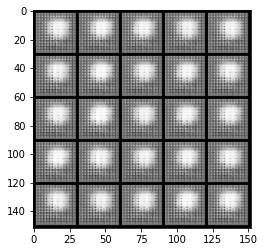

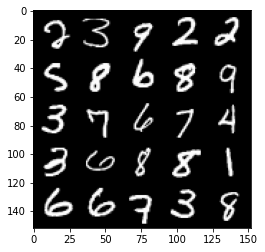

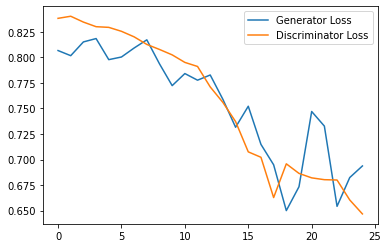

Epoch 2, step 1000: Generator loss: 0.8683431074619293, discriminator loss: 0.5428373111486435


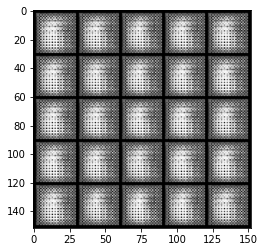

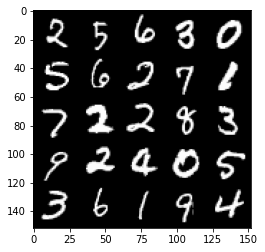

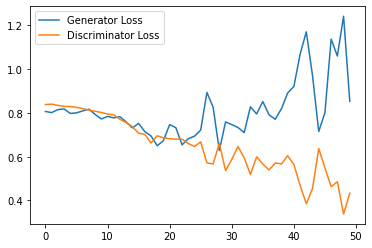

Epoch 3, step 1500: Generator loss: 1.5841701439619065, discriminator loss: 0.29404782785475253


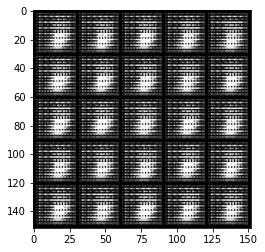

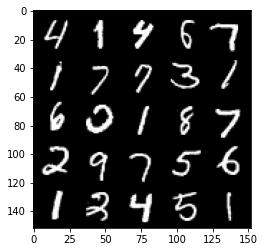

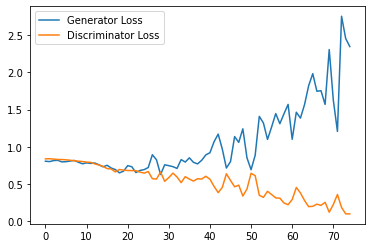

Epoch 4, step 2000: Generator loss: 2.795938847541809, discriminator loss: 0.061417563404887916


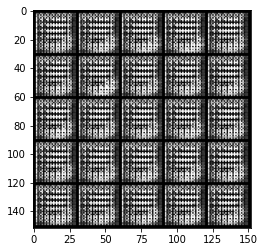

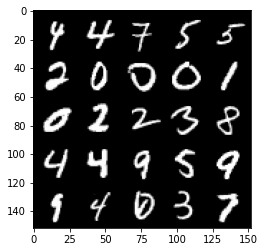

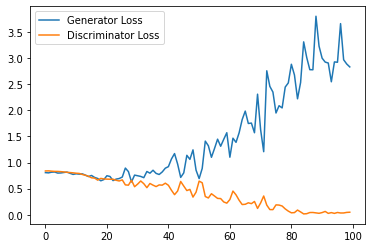

Epoch 5, step 2500: Generator loss: 3.032093569755554, discriminator loss: 0.06337198716029525


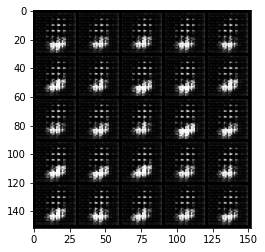

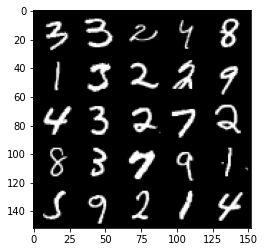

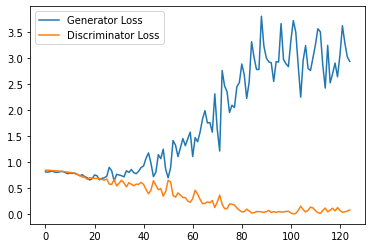

Epoch 6, step 3000: Generator loss: 3.5352342290878296, discriminator loss: 0.040820447320118546


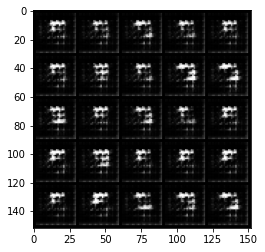

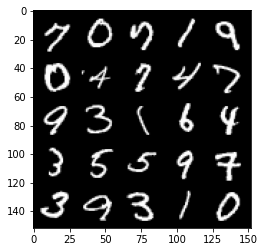

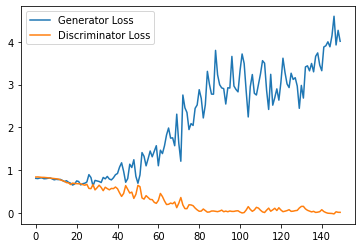

Epoch 7, step 3500: Generator loss: 2.5139624280929564, discriminator loss: 0.22459124086797239


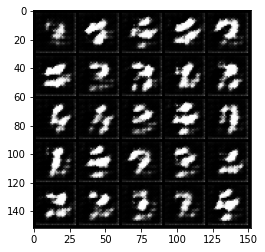

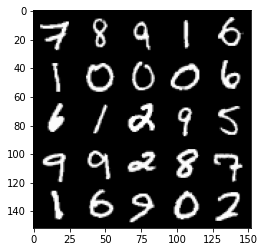

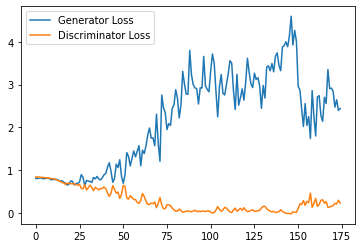

Epoch 8, step 4000: Generator loss: 2.182746809244156, discriminator loss: 0.32788562911748886


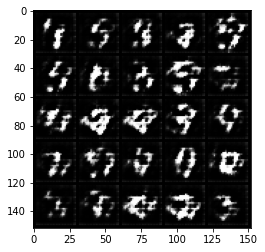

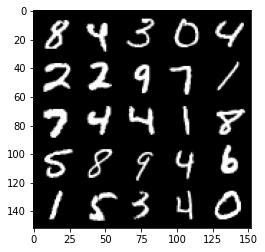

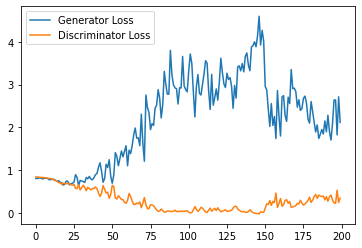

Epoch 9, step 4500: Generator loss: 2.009421258687973, discriminator loss: 0.30020181357860565


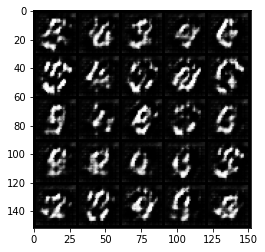

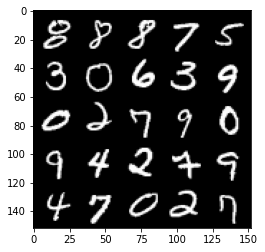

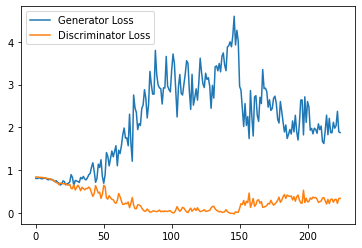

Epoch 10, step 5000: Generator loss: 2.2705350999832152, discriminator loss: 0.2872175366282463


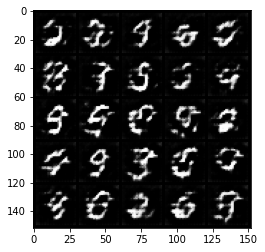

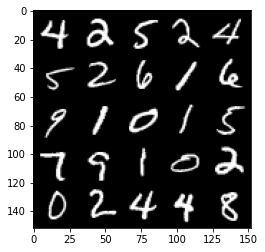

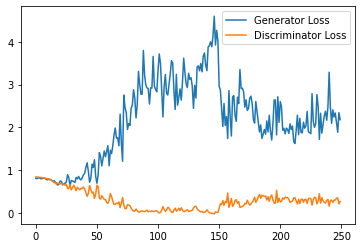

Epoch 11, step 5500: Generator loss: 2.1057675004005434, discriminator loss: 0.3046674883365631


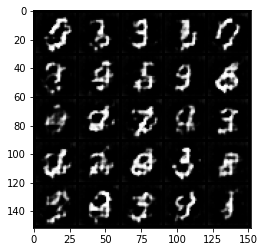

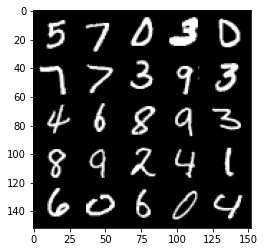

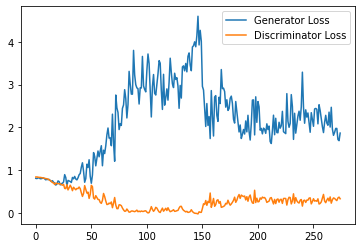

Epoch 12, step 6000: Generator loss: 2.099450698852539, discriminator loss: 0.28582162588834764


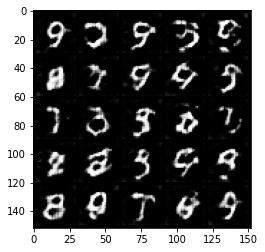

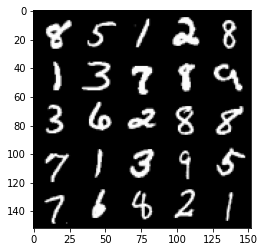

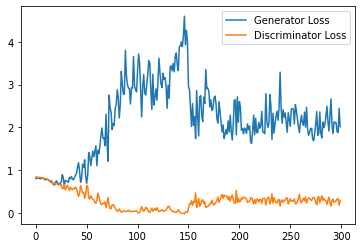

Epoch 13, step 6500: Generator loss: 1.9265484528541565, discriminator loss: 0.3128092872798443


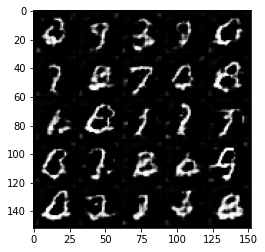

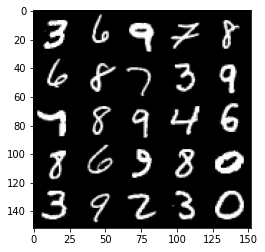

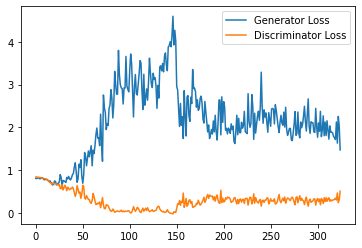

Epoch 14, step 7000: Generator loss: 1.8887187844514848, discriminator loss: 0.35326000425219534


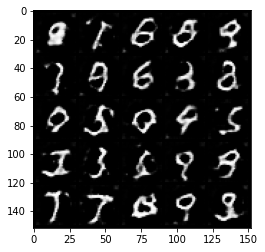

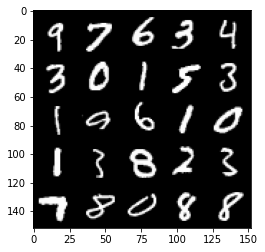

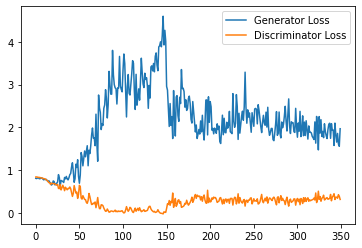

Epoch 15, step 7500: Generator loss: 1.7070655244588853, discriminator loss: 0.40268110886216163


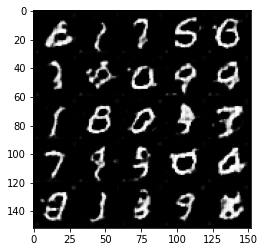

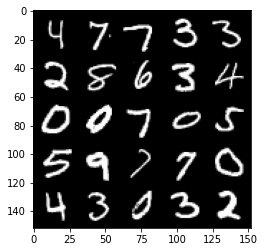

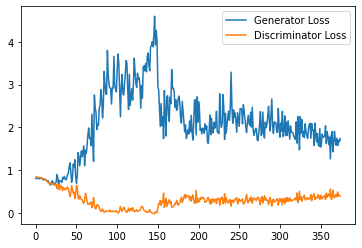

Epoch 17, step 8000: Generator loss: 1.6976479034423828, discriminator loss: 0.42869124314188956


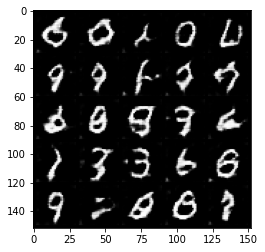

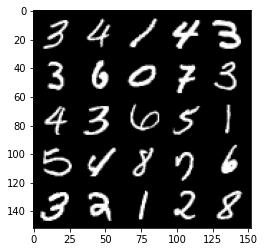

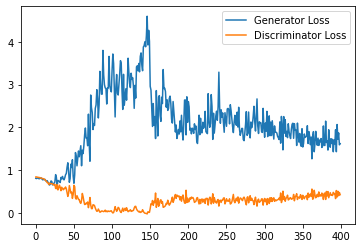

Epoch 18, step 8500: Generator loss: 1.5704787267446518, discriminator loss: 0.4489410556554794


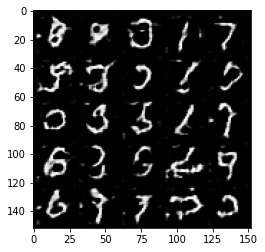

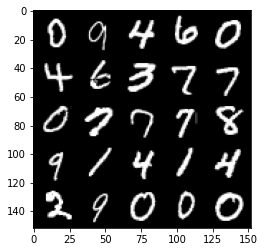

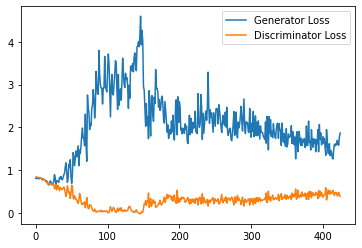

Epoch 19, step 9000: Generator loss: 1.6562924740314484, discriminator loss: 0.4512498701512814


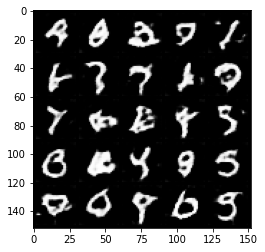

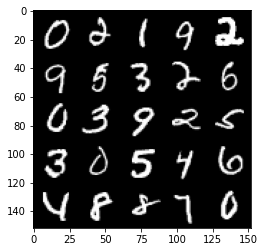

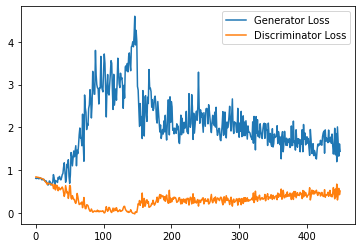

Epoch 20, step 9500: Generator loss: 1.6202147543430327, discriminator loss: 0.4584572522044182


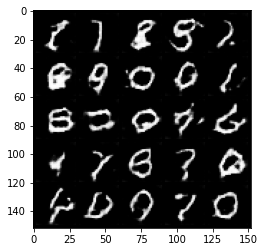

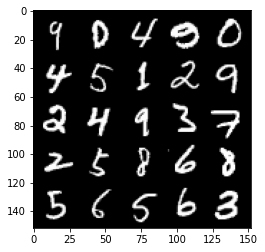

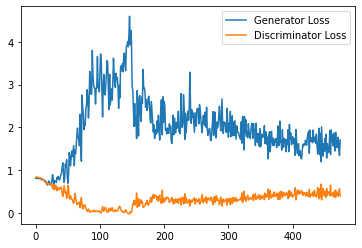

Epoch 21, step 10000: Generator loss: 1.4279341197013855, discriminator loss: 0.48291999089717863


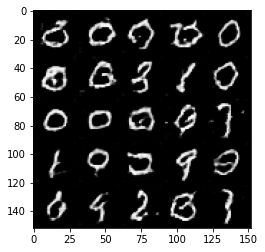

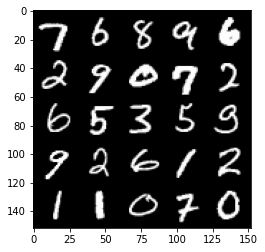

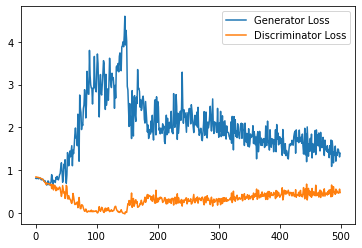

Epoch 22, step 10500: Generator loss: 1.529009325504303, discriminator loss: 0.4833389036655426


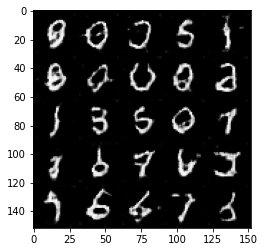

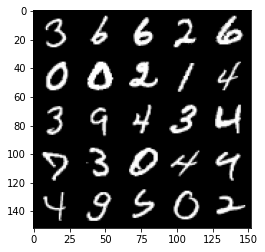

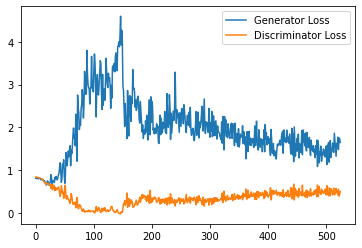

Epoch 23, step 11000: Generator loss: 1.5173065668344499, discriminator loss: 0.5012227435708045


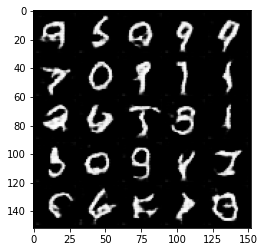

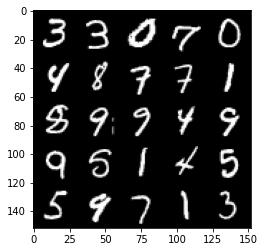

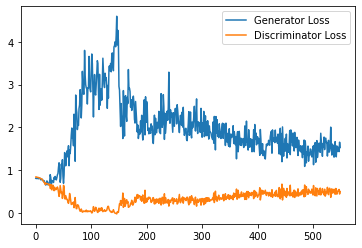

Epoch 24, step 11500: Generator loss: 1.4478895725011827, discriminator loss: 0.4996439553499222


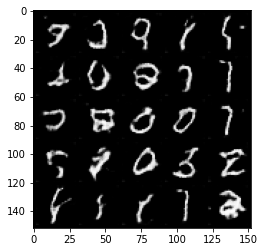

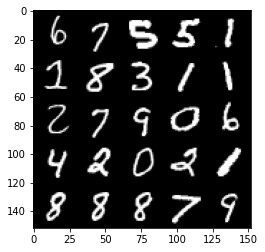

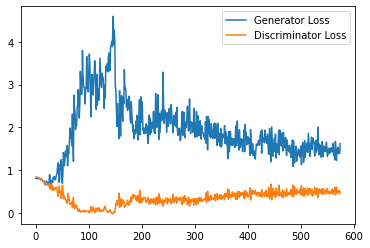

Epoch 25, step 12000: Generator loss: 1.4254280186891555, discriminator loss: 0.5089052346944809


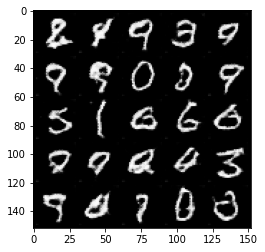

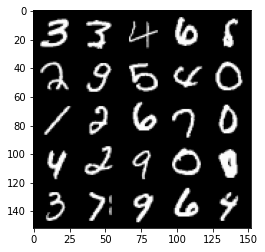

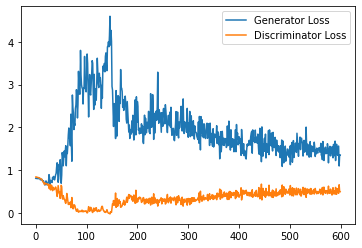

Epoch 26, step 12500: Generator loss: 1.445362375855446, discriminator loss: 0.5124126632213593


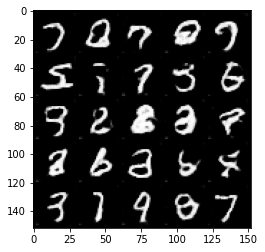

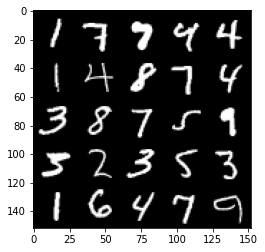

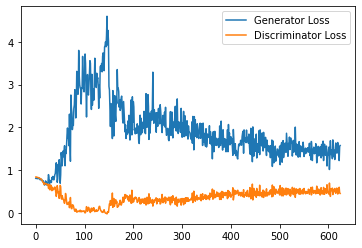

Epoch 27, step 13000: Generator loss: 1.4319778867959976, discriminator loss: 0.515742179095745


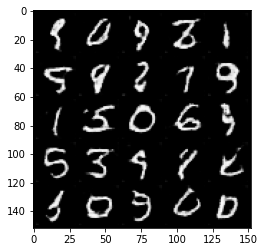

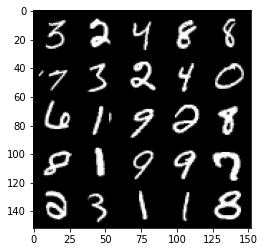

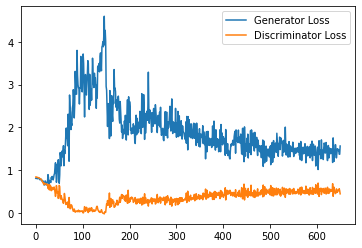

Epoch 28, step 13500: Generator loss: 1.392267825961113, discriminator loss: 0.5147424372434616


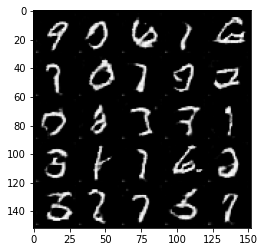

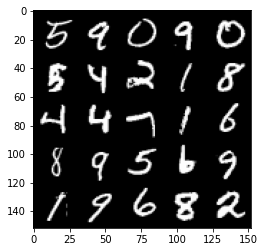

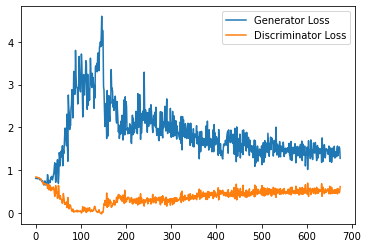

Epoch 29, step 14000: Generator loss: 1.4221470408439636, discriminator loss: 0.5226338067650795


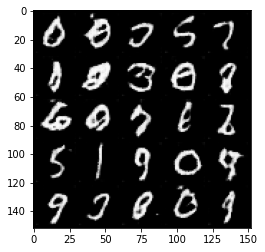

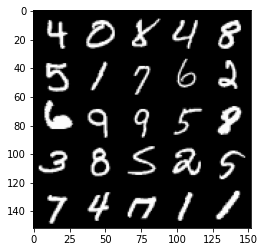

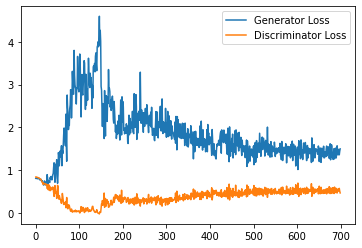

Epoch 30, step 14500: Generator loss: 1.3279193581342696, discriminator loss: 0.5252014273405075


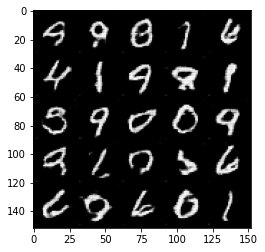

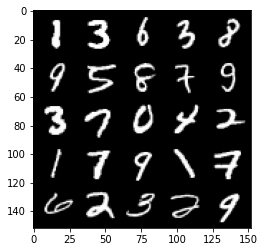

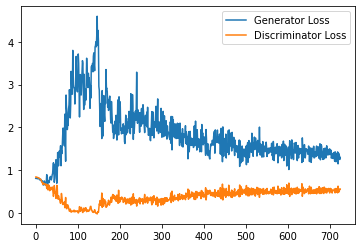

Epoch 31, step 15000: Generator loss: 1.3571701769828797, discriminator loss: 0.515965720653534


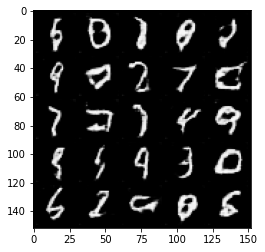

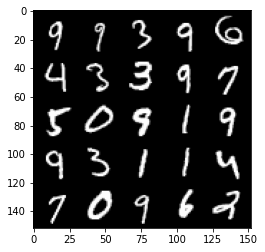

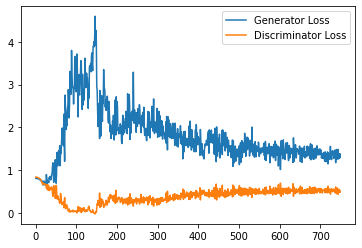

Epoch 33, step 15500: Generator loss: 1.359187260746956, discriminator loss: 0.5193301323056221


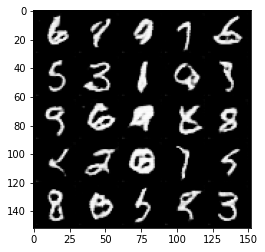

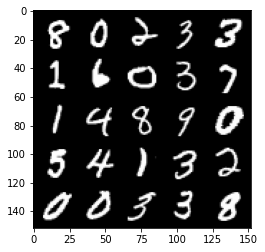

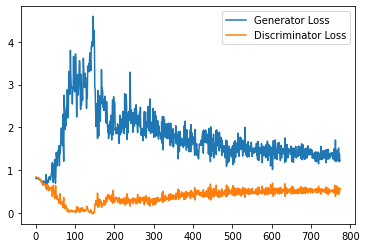

Epoch 34, step 16000: Generator loss: 1.4095105735063553, discriminator loss: 0.5202135804891587


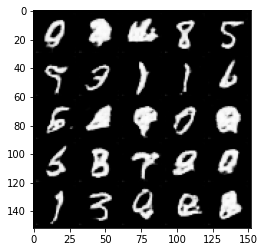

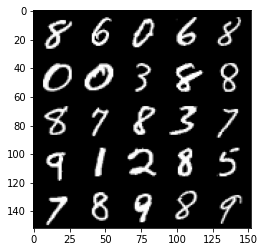

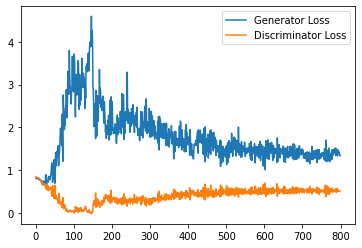

Epoch 35, step 16500: Generator loss: 1.3483418201208115, discriminator loss: 0.5153223738670349


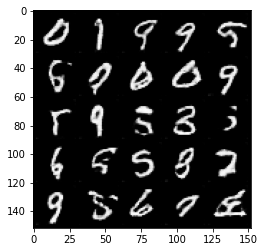

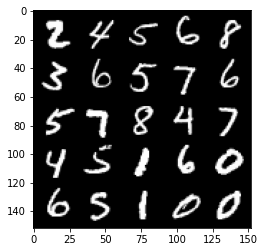

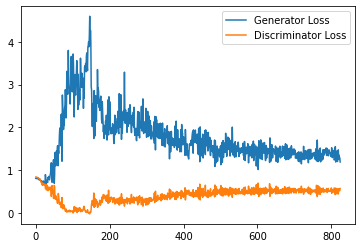

Epoch 36, step 17000: Generator loss: 1.36289987552166, discriminator loss: 0.5143843565583229


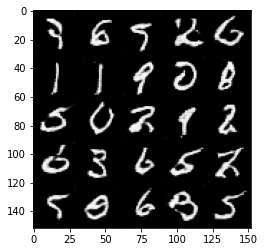

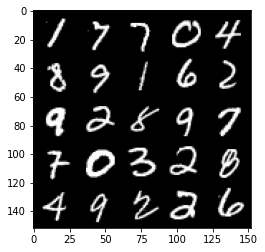

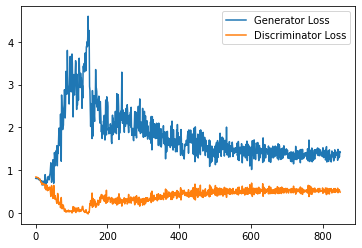

Epoch 37, step 17500: Generator loss: 1.361458294391632, discriminator loss: 0.5161276044845581


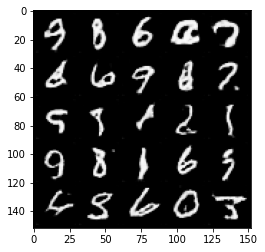

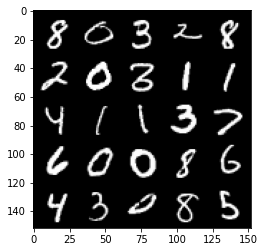

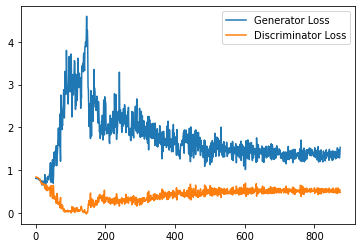

Epoch 38, step 18000: Generator loss: 1.3684957317113877, discriminator loss: 0.5147328942418098


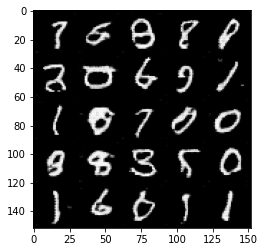

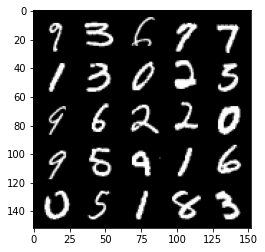

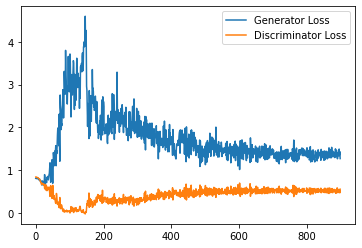

Epoch 39, step 18500: Generator loss: 1.3367911138534545, discriminator loss: 0.49863526511192324


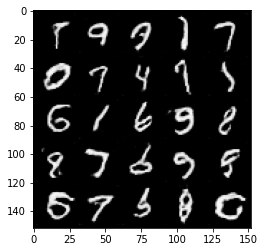

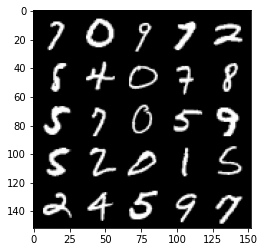

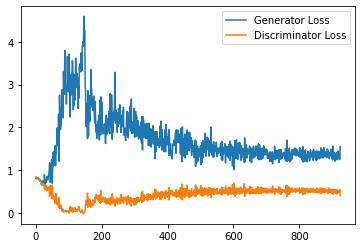

Epoch 40, step 19000: Generator loss: 1.3722228263616563, discriminator loss: 0.49860564041137695


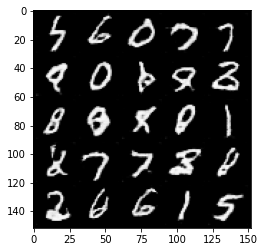

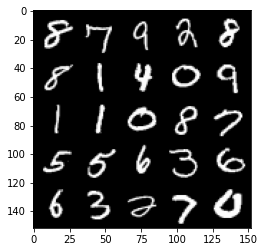

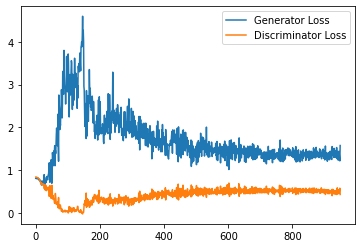

Epoch 41, step 19500: Generator loss: 1.3669497060775757, discriminator loss: 0.5030793122053147


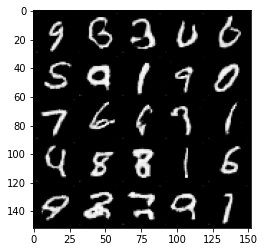

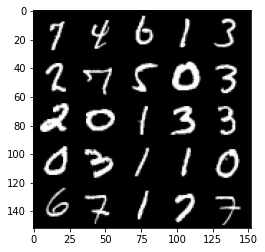

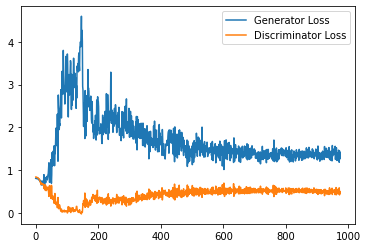

Epoch 42, step 20000: Generator loss: 1.3617373257875443, discriminator loss: 0.5153541979789734


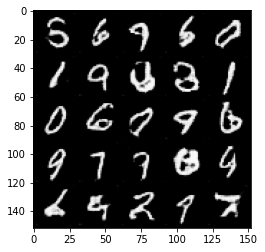

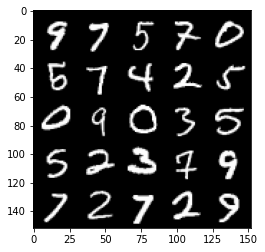

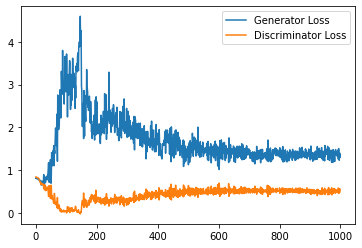

Epoch 43, step 20500: Generator loss: 1.3614044263362886, discriminator loss: 0.502131518125534


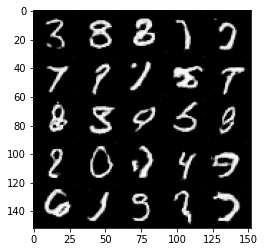

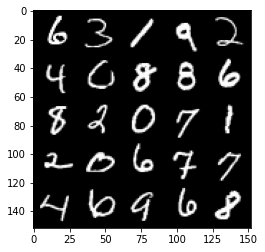

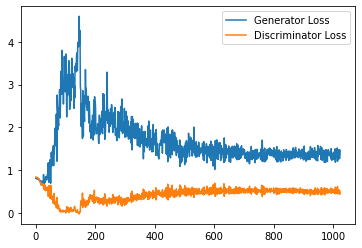

Epoch 44, step 21000: Generator loss: 1.338655596256256, discriminator loss: 0.5046727555990219


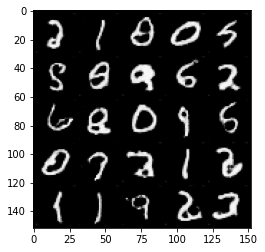

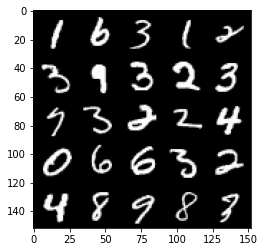

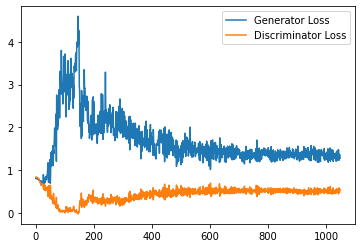

Epoch 45, step 21500: Generator loss: 1.3203303668498994, discriminator loss: 0.49225832504034045


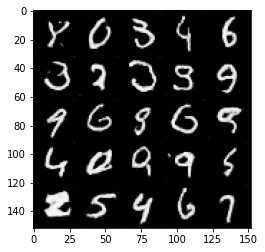

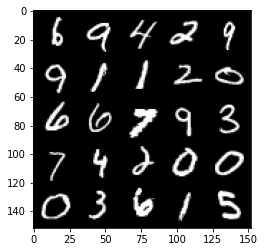

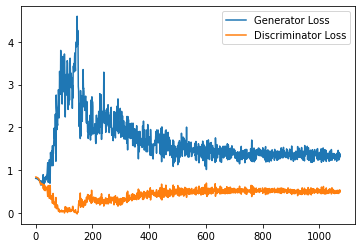

Epoch 46, step 22000: Generator loss: 1.3417833976745606, discriminator loss: 0.49230331110954284


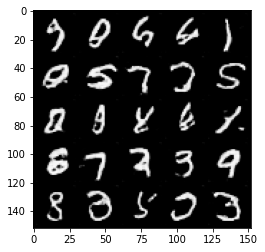

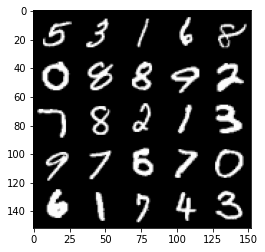

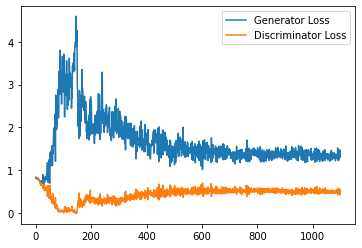

Epoch 47, step 22500: Generator loss: 1.3560395293235779, discriminator loss: 0.48936376118659974


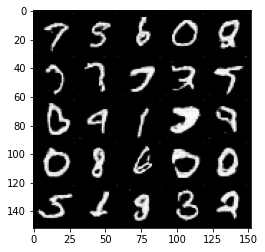

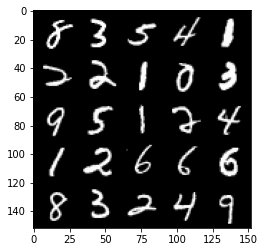

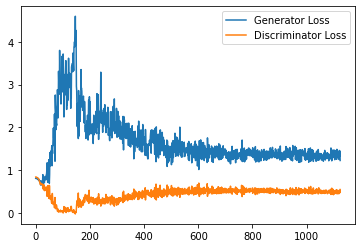

Epoch 49, step 23000: Generator loss: 1.3616920983791352, discriminator loss: 0.4837581036090851


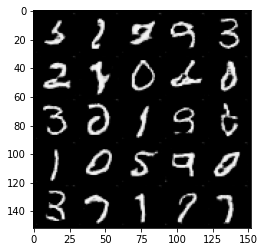

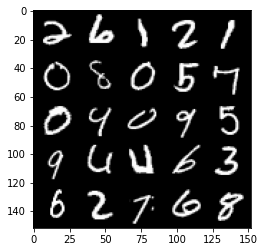

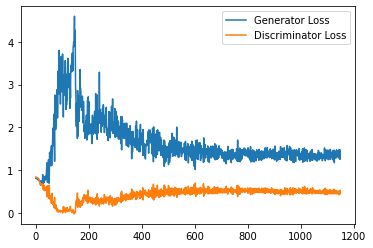

Epoch 50, step 23500: Generator loss: 1.3711165550947189, discriminator loss: 0.48669496458768846


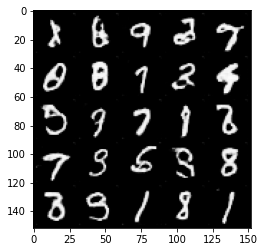

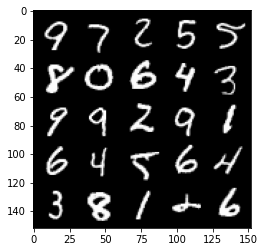

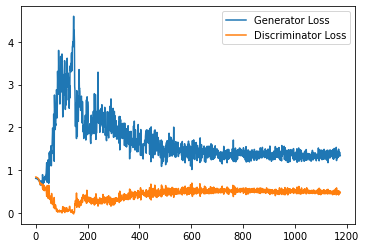

Epoch 51, step 24000: Generator loss: 1.3368981592655182, discriminator loss: 0.4851949946284294


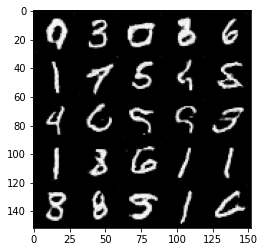

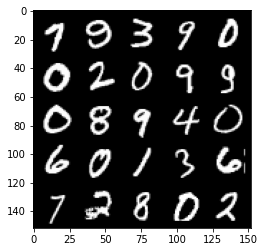

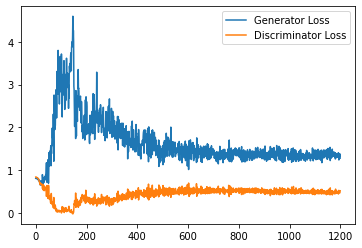

Epoch 52, step 24500: Generator loss: 1.3590837129354476, discriminator loss: 0.4781355387568474


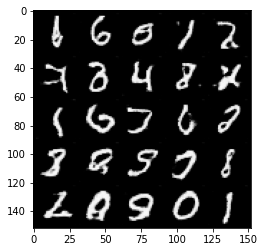

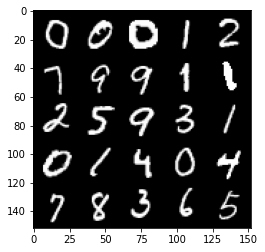

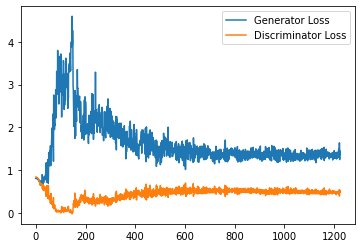

Epoch 53, step 25000: Generator loss: 1.38168335211277, discriminator loss: 0.48162650495767595


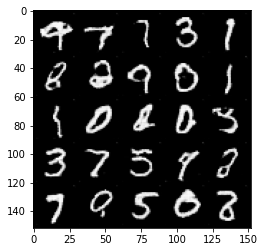

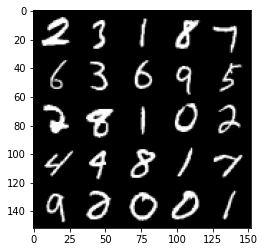

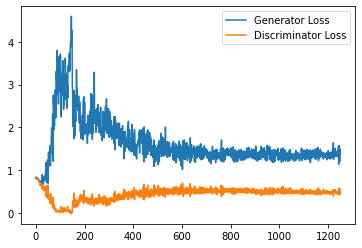

Epoch 54, step 25500: Generator loss: 1.4164006630182266, discriminator loss: 0.4864923732280731


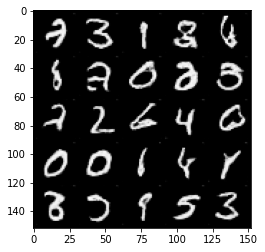

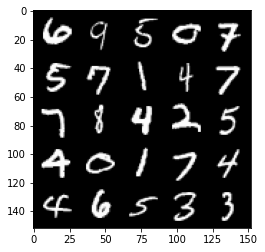

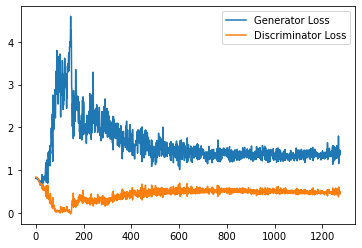

Epoch 55, step 26000: Generator loss: 1.3899001120328902, discriminator loss: 0.4880830695033073


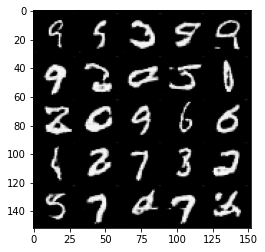

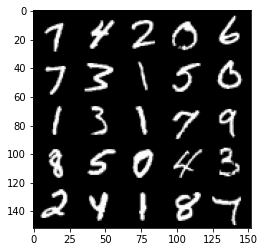

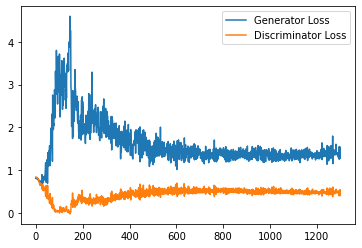

Epoch 56, step 26500: Generator loss: 1.3595716279745103, discriminator loss: 0.48363128596544264


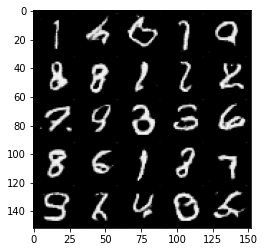

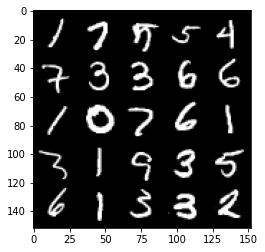

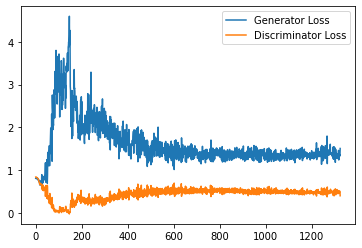

Epoch 57, step 27000: Generator loss: 1.403654149055481, discriminator loss: 0.4743847073316574


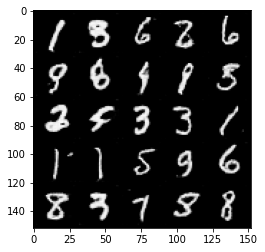

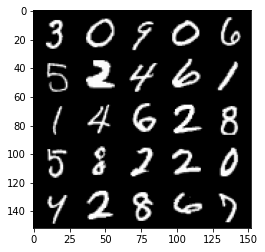

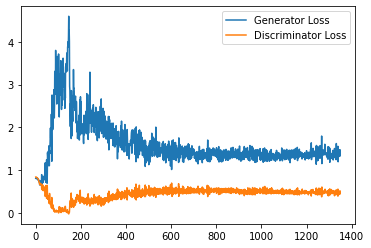

Epoch 58, step 27500: Generator loss: 1.3929473847150802, discriminator loss: 0.47148811250925066


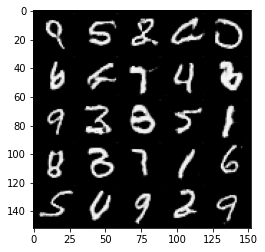

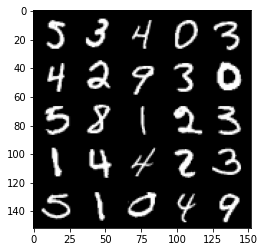

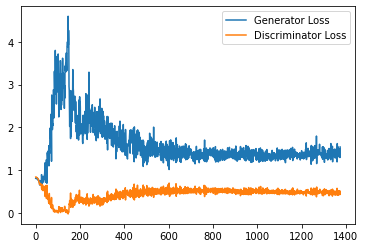

Epoch 59, step 28000: Generator loss: 1.3707742230892181, discriminator loss: 0.4706636085510254


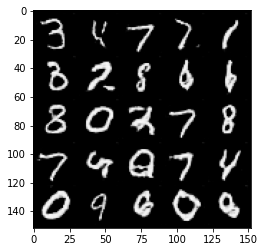

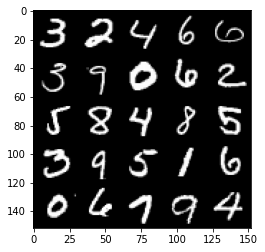

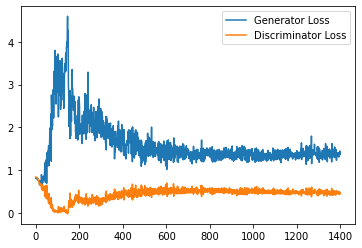

Epoch 60, step 28500: Generator loss: 1.3484066385030746, discriminator loss: 0.4871069040298462


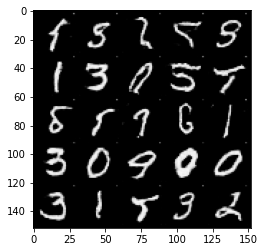

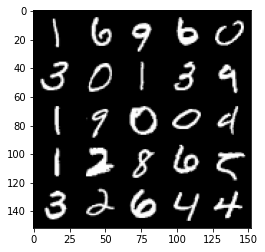

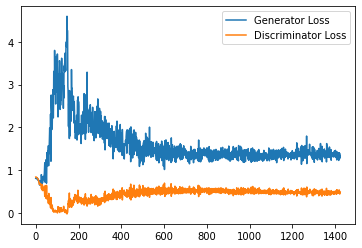

Epoch 61, step 29000: Generator loss: 1.3631509201526641, discriminator loss: 0.47333440971374513


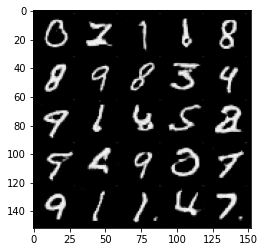

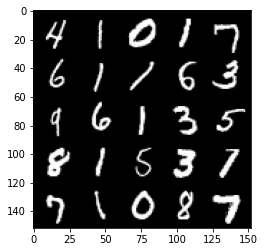

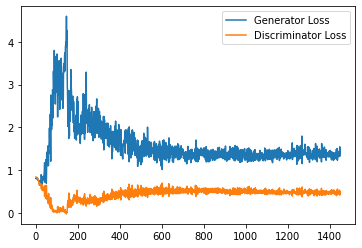

Epoch 62, step 29500: Generator loss: 1.3570473347902299, discriminator loss: 0.4769493672847748


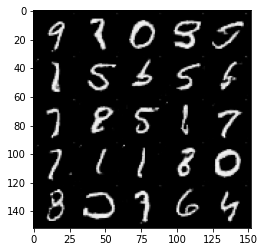

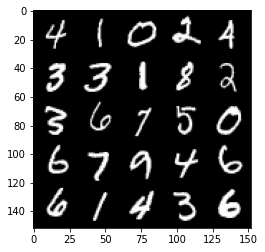

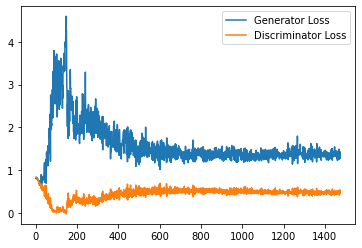

Epoch 63, step 30000: Generator loss: 1.3563281120061874, discriminator loss: 0.47535250276327135


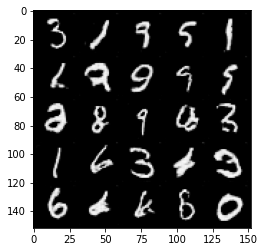

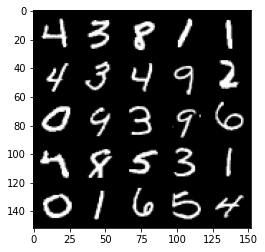

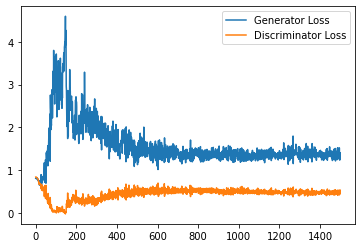

Epoch 65, step 30500: Generator loss: 1.3797706500291824, discriminator loss: 0.4817879405617714


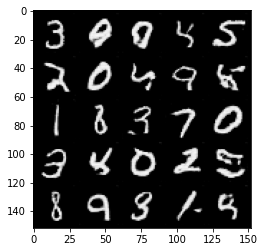

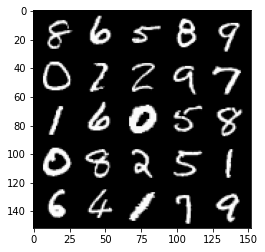

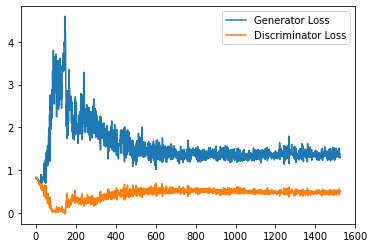

Epoch 66, step 31000: Generator loss: 1.3726636018753051, discriminator loss: 0.4733812925219536


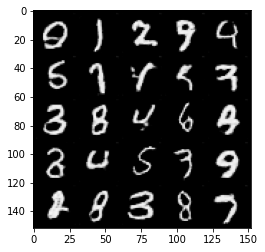

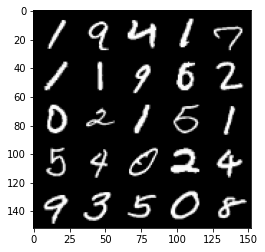

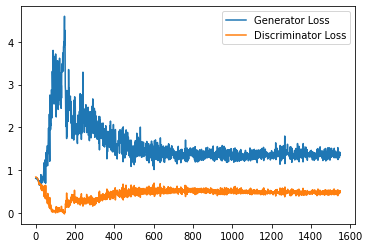

Epoch 67, step 31500: Generator loss: 1.3486746926307678, discriminator loss: 0.4784667939543724


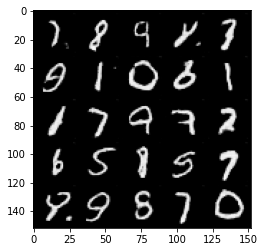

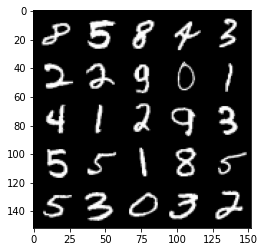

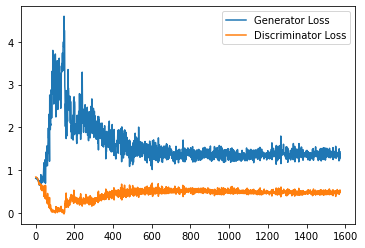

Epoch 68, step 32000: Generator loss: 1.3695249055624008, discriminator loss: 0.47678712171316145


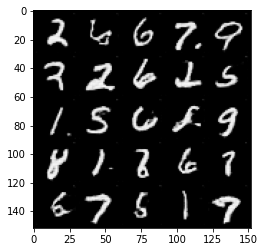

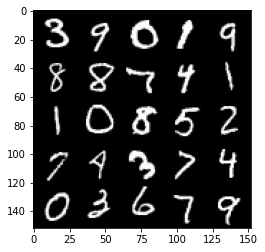

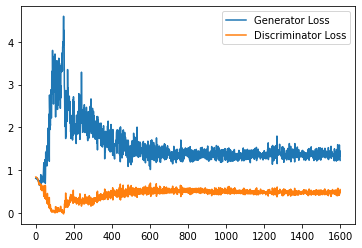

Epoch 69, step 32500: Generator loss: 1.385288375377655, discriminator loss: 0.47579734814167024


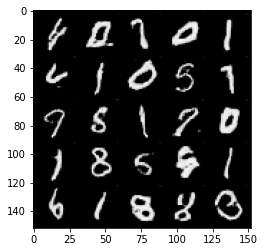

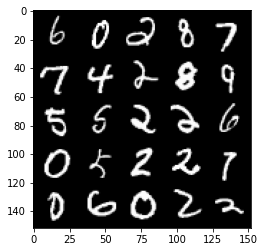

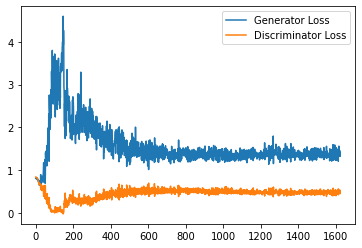

Epoch 70, step 33000: Generator loss: 1.3606436123847963, discriminator loss: 0.4887180736064911


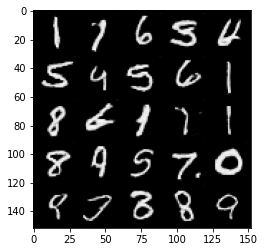

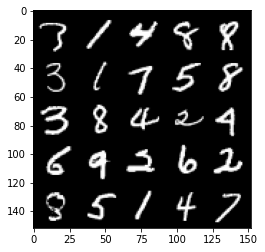

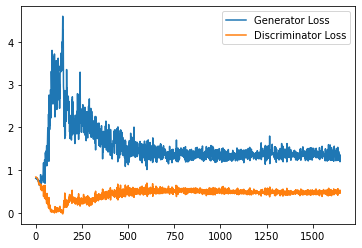

Epoch 71, step 33500: Generator loss: 1.3140232310295106, discriminator loss: 0.4863663327097893


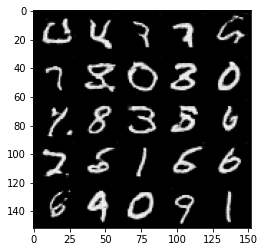

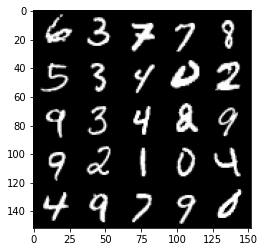

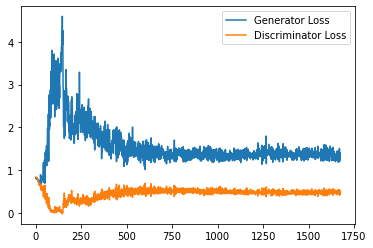

Epoch 72, step 34000: Generator loss: 1.3437751405239104, discriminator loss: 0.4743724915981293


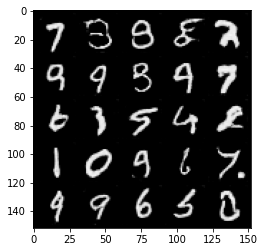

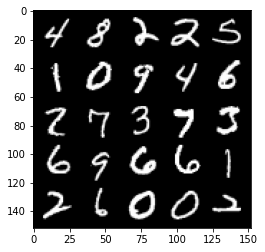

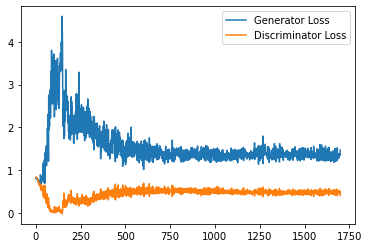

Epoch 73, step 34500: Generator loss: 1.333663504242897, discriminator loss: 0.4882104884982109


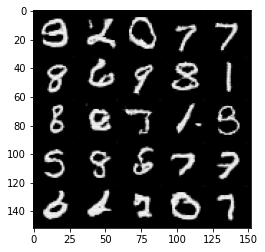

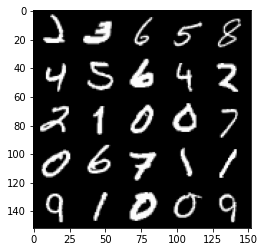

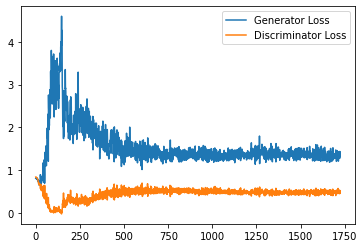

Epoch 74, step 35000: Generator loss: 1.3606532187461853, discriminator loss: 0.4799360640048981


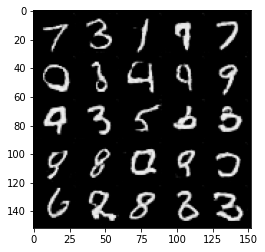

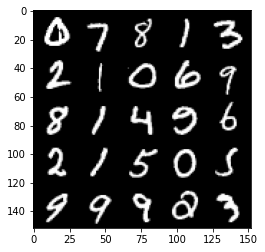

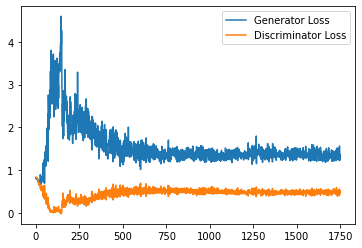

Epoch 75, step 35500: Generator loss: 1.338431490302086, discriminator loss: 0.4838870280981064


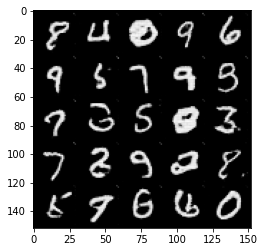

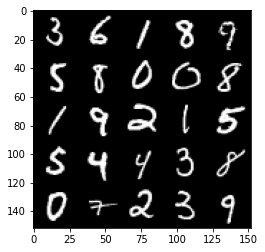

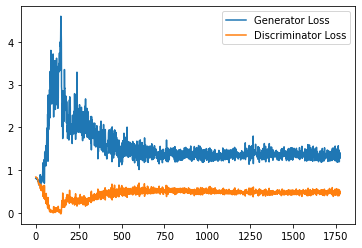

Epoch 76, step 36000: Generator loss: 1.331057133436203, discriminator loss: 0.4859483003616333


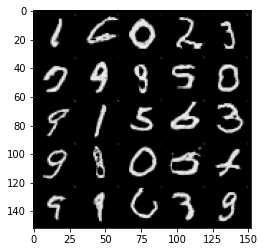

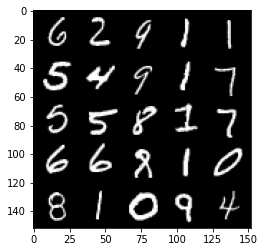

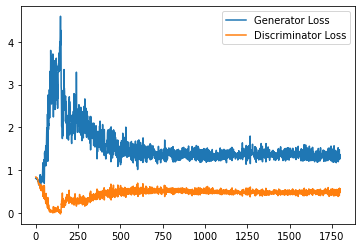

Epoch 77, step 36500: Generator loss: 1.3455555356740951, discriminator loss: 0.48807722651958463


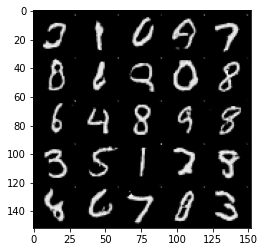

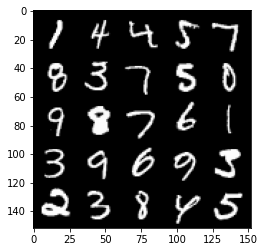

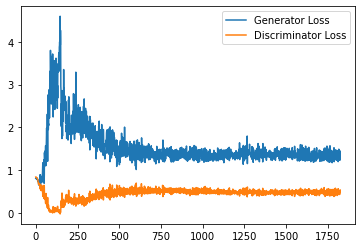

Epoch 78, step 37000: Generator loss: 1.3008267982006072, discriminator loss: 0.4888688445687294


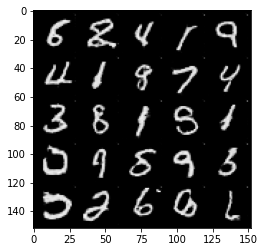

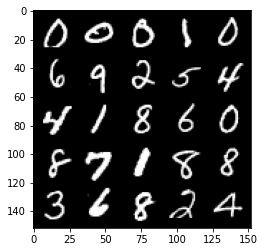

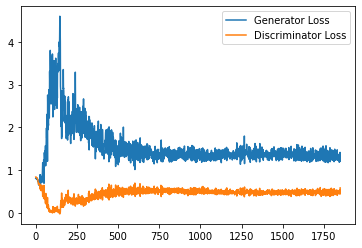

Epoch 79, step 37500: Generator loss: 1.3358596025705338, discriminator loss: 0.4804924931526184


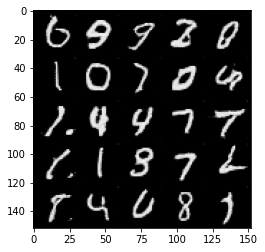

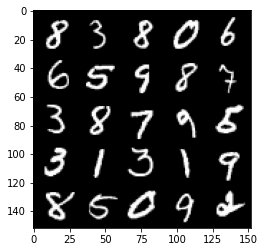

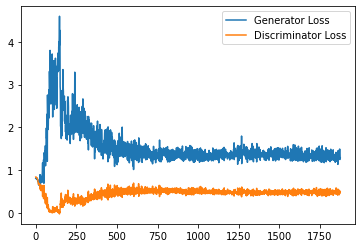

In [9]:
cur_step = 0
generator_losses = []
discriminator_losses = []

for epoch in range(n_epochs):
    # Dataloader returns the batches and the labels
    for real, _ in tqdm(dataloader):
        cur_batch_size = len(real)
        # Flatten the batch of real images from the dataset
        real = real.to(device)

        c_labels = get_noise(cur_batch_size, c_dim, device=device)    
        ### Update discriminator ###
        # Zero out the discriminator gradients
        disc_opt.zero_grad()
        # Get noise corresponding to the current batch_size 
        fake_noise = get_noise(cur_batch_size, z_dim, device=device)
        # Combine the noise vectors and the one-hot labels for the generator
        noise_and_labels = combine_vectors(fake_noise, c_labels)
        # Generate the conditioned fake images
        fake = gen(noise_and_labels)
        
        # Get the discriminator's predictions
        disc_fake_pred, disc_q_pred = disc(fake.detach())
        disc_q_mean = disc_q_pred[:, :c_dim]
        disc_q_logvar = disc_q_pred[:, c_dim:]
        mutual_information = c_criterion(c_labels, disc_q_mean, disc_q_logvar)
        disc_real_pred, _ = disc(real)
        disc_fake_loss = adv_criterion(disc_fake_pred, torch.zeros_like(disc_fake_pred))
        disc_real_loss = adv_criterion(disc_real_pred, torch.ones_like(disc_real_pred))
        disc_loss = (disc_fake_loss + disc_real_loss) / 2 - c_lambda * mutual_information
        disc_loss.backward(retain_graph=True)
        disc_opt.step() 

        # Keep track of the average discriminator loss
        discriminator_losses += [disc_loss.item()]

        ### Update generator ###
        # Zero out the generator gradients
        gen_opt.zero_grad()

        disc_fake_pred, disc_q_pred = disc(fake)
        disc_q_mean = disc_q_pred[:, :c_dim]
        disc_q_logvar = disc_q_pred[:, c_dim:]
        mutual_information = c_criterion(c_labels, disc_q_mean, disc_q_logvar)
        gen_loss = adv_criterion(disc_fake_pred, torch.ones_like(disc_fake_pred)) - c_lambda * mutual_information
        gen_loss.backward()
        gen_opt.step()

        # Keep track of the generator losses
        generator_losses += [gen_loss.item()]

        if cur_step % display_step == 0 and cur_step > 0:
            gen_mean = sum(generator_losses[-display_step:]) / display_step
            disc_mean = sum(discriminator_losses[-display_step:]) / display_step
            print(f"Epoch {epoch}, step {cur_step}: Generator loss: {gen_mean}, discriminator loss: {disc_mean}")
            show_tensor_images(fake)
            show_tensor_images(real)
            step_bins = 20
            x_axis = sorted([i * step_bins for i in range(len(generator_losses) // step_bins)] * step_bins)
            num_examples = (len(generator_losses) // step_bins) * step_bins
            plt.plot(
                range(num_examples // step_bins), 
                torch.Tensor(generator_losses[:num_examples]).view(-1, step_bins).mean(1),
                label="Generator Loss"
            )
            plt.plot(
                range(num_examples // step_bins), 
                torch.Tensor(discriminator_losses[:num_examples]).view(-1, step_bins).mean(1),
                label="Discriminator Loss"
            )
            plt.legend()
            plt.show()
        cur_step += 1

## Exploration
You can do a bit of exploration now!

In [10]:
# Before you explore, you should put the generator
# in eval mode, both in general and so that batch norm
# doesn't cause you issues and is using its eval statistics
gen = gen.eval()

#### Changing the Latent Code Vector
You can generate some numbers with your new model! You can add interpolation as well to make it more interesting.

So starting from a image, you will produce intermediate images that look more and more like the ending image until you get to the final image. Your're basically morphing one image into another. You can choose what these two images will be using your conditional GAN.

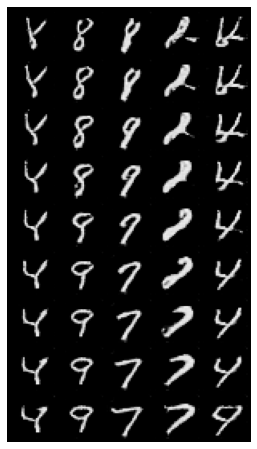

In [11]:
import math

### Change me! ###
n_interpolation = 9 # Choose the interpolation: how many intermediate images you want + 2 (for the start and end image)

def interpolate_class(n_view=5):
    interpolation_noise = get_noise(n_view, z_dim, device=device).repeat(n_interpolation, 1)
    first_label = get_noise(1, c_dim).repeat(n_view, 1)[None, :]
    second_label = first_label.clone()
    first_label[:, :, 0] =  -2
    second_label[:, :, 0] =  2
    

    # Calculate the interpolation vector between the two labels
    percent_second_label = torch.linspace(0, 1, n_interpolation)[:, None, None]
    interpolation_labels = first_label * (1 - percent_second_label) + second_label * percent_second_label
    interpolation_labels = interpolation_labels.view(-1, c_dim)

    # Combine the noise and the labels
    noise_and_labels = combine_vectors(interpolation_noise, interpolation_labels.to(device))
    fake = gen(noise_and_labels)
    show_tensor_images(fake, num_images=n_interpolation * n_view, nrow=n_view, show=False)

plt.figure(figsize=(8, 8))
interpolate_class()
_ = plt.axis('off')


You can also visualize the impact of pairwise changes of the latent code for a given noise vector.

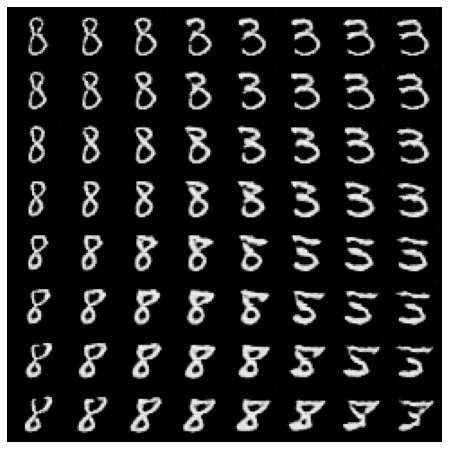

In [12]:
import math

### Change me! ###
n_interpolation = 8 # Choose the interpolation: how many intermediate images you want + 2 (for the start and end image)

def interpolate_class():
    interpolation_noise = get_noise(1, z_dim, device=device).repeat(n_interpolation * n_interpolation, 1)
    first_label = get_noise(1, c_dim).repeat(n_interpolation * n_interpolation, 1)
    
    # Calculate the interpolation vector between the two labels
    first_label = torch.linspace(-2, 2, n_interpolation).repeat(n_interpolation)
    second_label = torch.linspace(-2, 2, n_interpolation).repeat_interleave(n_interpolation)
    interpolation_labels = torch.stack([first_label, second_label], dim=1) 

    # Combine the noise and the labels
    noise_and_labels = combine_vectors(interpolation_noise, interpolation_labels.to(device))
    fake = gen(noise_and_labels)
    show_tensor_images(fake, num_images=n_interpolation * n_interpolation, nrow=n_interpolation, show=False)

plt.figure(figsize=(8, 8))
interpolate_class()
_ = plt.axis('off')
